# Hybrid Image Generator

This project implements the task of converting text prompts into hybrid images. You can design two text prompts, prompt_x and prompt_y. After successfully running the notebook, two images can be generated: the first image appears as prompt_x from a distance and as prompt_y up close. Conversely, the second image appears as prompt_y from a distance and as prompt_x up close.

The detailed approach is as follows: the project first uses the framework from the Rotation Overlays project to generate two images corresponding to the prompts. These two images are then decomposed into high-frequency and low-frequency components, which are cross-combined as follows: the high-frequency component of the first image is combined with the low-frequency component of the second image, and the low-frequency component of the first image is combined with the high-frequency component of the second image. This results in two hybrid images with optical illusions.

The core idea is as follows: if two images are randomly selected, their high- and low-frequency components extracted, and then combined, misalignment is likely to occur, leading to chaotic hybrid images that fail to convey a clear appearance. On the other hand, if alignment is enforced, the lack of sufficient matching features between the two images might still result in suboptimal effects.

However, I noticed that when using the Rotation Overlays project to generate images, the high-level alignment issue is cleverly avoided since the bottom image is fixed. As a result, the generated images are inherently aligned.

For the best results, I suggest having a rough idea of the desired appearance of the generated images when describing the prompts. Randomly generating images for two unrelated prompts might make alignment difficult, potentially compromising the effectiveness of the hybrid images.

## Rotation Overlays

As described above, first use Rotation Overlays to generate two images based on the given text. It is expected that the two generated images are aligned on a high level. If they are not aligned, you can restart the session and rerun all the cells. Based on my attempts, the probability of generating aligned images is relatively high, and if using an A100, the results can be obtained within 10 minutes. Besides, you can basically determine the alignment level after completing the first 200 steps.

Instructions by the original author:

0. Go to the Runtime menu, and make sure this notebook is using GPU!
1. Run the top 2 code cells (one cleans colab's junk and downloads the source code, while the other installs python packages)
2. Click 'Runtime', then 'Restart Runtime'. You need to do this the first time you open this notebook to avoid weird random errors from the pip installations.
3. Run code cell 3 to load stable diffusion. The first time you run it it will take a few minutes to download; subsequent times won't take long at all though.
4. Run all the cells below that, and customize prompt_x and prompt_y

In [ ]:
%%bash
if [ ! -d ".git" ]; then
    rm -rf * .*; #Get rid of Colab's default junk files
    git clone -b master https://github.com/RyannDaGreat/Diffusion-Illusions .
fi

In [ ]:
%pip install --upgrade -r requirements.txt
%pip install rp -- upgrade
# You may need to restart the runtime after installing these
# I'm not sure why this helps, but all sorts of weird random errors pop up in Colab if you don't

ERROR: Could not find a version that satisfies the requirement upgrade (from versions: none)
ERROR: No matching distribution found for upgrade


In [ ]:
import numpy as np
import rp
import torch
import torch.nn as nn
import source.stable_diffusion as sd
from easydict import EasyDict
from source.learnable_textures import LearnableImageFourier
from source.stable_diffusion_labels import NegativeLabel
from itertools import chain
import time

In [ ]:
#ONLY GOOD PROMPTS HERE
example_prompts = rp.load_yaml_file('source/example_prompts.yaml')
print('Available example prompts:', ', '.join(example_prompts))

#These prompts are all strings - you can replace them with whatever you want! By default it lets you choose from example prompts
# prompt_w, prompt_x, prompt_y, prompt_z = rp.gather(example_prompts, 'miku froggo lipstick pyramids'.split())

prompt_x = 'A leopard'
prompt_y = 'A lion'

negative_prompt = ''

print()
print('Negative prompt:',repr(negative_prompt))
print()
print('Chosen prompts:')
print('    prompt_x =', repr(prompt_x))
print('    prompt_y =', repr(prompt_y))

Available example prompts: kitten_in_box, botw_landscape, magic_emma_watson, yorkshire_terrier_santa, norwegian_winter_girl, magic_forest_temple, sailing_ship, bioshock_lighthouse, two_bunnys_hugging, thomas_tank_military, wolf_on_rock, victorial_dress, lolita_dress_magical_elf, pencil_giraffe_head, pencil_penguin, pencil_violin, pencil_orca_whale, pencil_cow, pencil_walrus, pencil_cat_head, pencil_dog_head, ape_with_gun, human_skeleton, gold_coins, golf_ball_in_forest, bear_in_forest, elephant_in_circus, mickey_mouse, mushroom, mario, burger, darth_vader, gandalf, fantasy_city, green_elf_girl, pikachu, spring, fall, winter, summer, miku, pyramids, dinosaur, lipstick, picard, bull_wing, froggo, assasin_creed, moon, minecraft_zombie, pistol, disco_ball, volcano, porche, hawaii_beach, walter_white, dalek, tardis, tennant, weeping_angel

Negative prompt: ''

Chosen prompts:
    prompt_x = 'A leopard'
    prompt_y = 'A lion'


In [ ]:
if 's' not in dir():
    model_name="CompVis/stable-diffusion-v1-4"
    gpu='cuda:0'
    s=sd.StableDiffusion(gpu,model_name)
device=s.device

[INFO] sd.py: loading stable diffusion...please make sure you have run `huggingface-cli login`.


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

[INFO] sd.py: loaded stable diffusion!


In [ ]:
label_x = NegativeLabel(prompt_x,negative_prompt)
label_y = NegativeLabel(prompt_y,negative_prompt)

In [ ]:
#Image Parametrization and Initialization (this section takes vram)

#Select Learnable Image Size (this has big VRAM implications!):
#Note: We use implicit neural representations for better image quality
#They're previously used in our paper "TRITON: Neural Neural Textures make Sim2Real Consistent" (see tritonpaper.github.io)
# ... and that representation is based on Fourier Feature Networks (see bmild.github.io/fourfeat)
learnable_image_maker = lambda: LearnableImageFourier(height=256, width=256, hidden_dim=256, num_features=128).to(s.device); SIZE=256
# learnable_image_maker = lambda: LearnableImageFourier(height=512,width=512,num_features=256,hidden_dim=256,scale=20).to(s.device);SIZE=512

bottom_image=learnable_image_maker()
top_image=learnable_image_maker()

In [ ]:
brightness=3

CLEAN_MODE = True # If it's False, we augment the images by randomly simulating how good a random printer might be when making the overlays...

def simulate_overlay(bottom, top):
    if CLEAN_MODE:
        exp=1
        brightness=3
        black=0
    else:
        exp=rp.random_float(.5,1)
        brightness=rp.random_float(1,5)
        black=rp.random_float(0,.5)
        bottom=rp.blend(bottom,black,rp.random_float())
        top=rp.blend(top,black,rp.random_float())
    return (bottom**exp * top**exp * brightness).clamp(0,99).tanh()

learnable_image_x=lambda: simulate_overlay(bottom_image(), top_image().rot90(k=0,dims=[1,2]))
learnable_image_y=lambda: simulate_overlay(bottom_image(), top_image().rot90(k=2,dims=[1,2]))


params=chain(
    bottom_image.parameters(),
    top_image.parameters(),
)
optim=torch.optim.SGD(params,lr=1e-4)

In [ ]:
nums=[0,1]

#Uncommenting one of the lines will disable some of the prompts, in case you don't want to use all four for some reason (like the Summer/Winter example)
# nums=[0  ,2,3]
# nums=[    2  ]
# nums=[0,1,2]
# nums=[1]
# nums=[0,1]
# nums=[0,2]


labels=[label_x,label_y]
learnable_images=[learnable_image_x,learnable_image_y]

#The weight coefficients for each prompt. For example, if we have [0,1,2,1], then prompt_w will provide no influence and prompt_y will have 1/2 the total influence
weights=[1,1]

labels=[labels[i] for i in nums]
learnable_images=[learnable_images[i] for i in nums]
weights=[weights[i] for i in nums]

weights=rp.as_numpy_array(weights)
weights=weights/weights.sum()
weights=weights*len(weights)

In [ ]:
#For saving a timelapse
ims=[]

In [ ]:
def get_display_image():
    return rp.tiled_images(
        [
            *[rp.as_numpy_image(image()) for image in learnable_images],
            rp.as_numpy_image(bottom_image()),
            rp.as_numpy_image(top_image()),
        ],
        length=len(learnable_images),
        border_thickness=0,
    )

Every 200 iterations we display an image in the form [[image_x, image_y], [bottom_image, top_image]] where
    image_x = bottom_image * top_image
    image_y = bottom_image * top_image.rot180()

Interrupt the kernel at any time to return the currently displayed image
You can run this cell again to resume training later on

Please expect this to take hours to get good images (especially on the slower Colab GPU's! The longer you wait the better they'll be


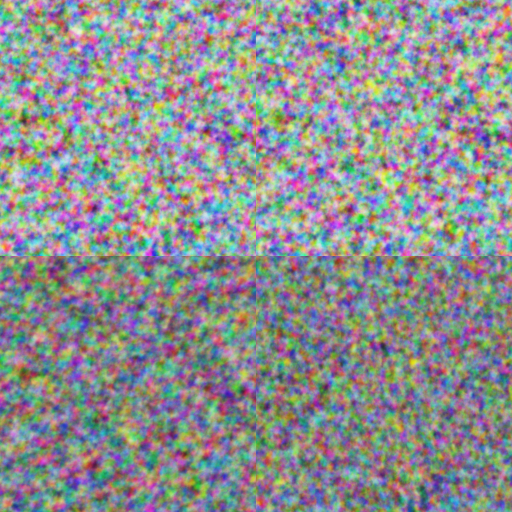

Status: : ETR=0:53:42.992635	ETA=0:57:33.206395	T=0:03:50.213760	Progress: 200/3000

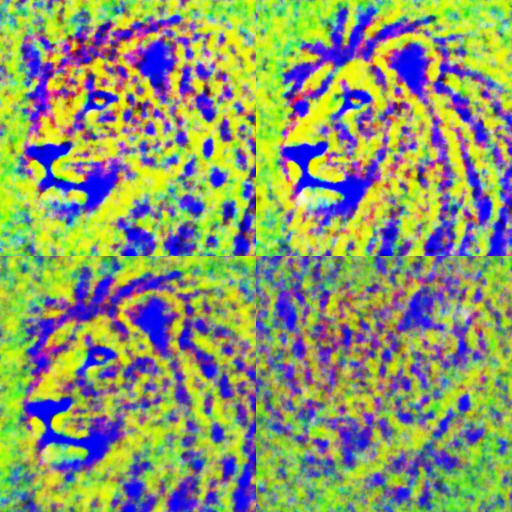

Status: : ETR=0:49:52.224282	ETA=0:57:32.566479	T=0:07:40.342197	Progress: 400/3000

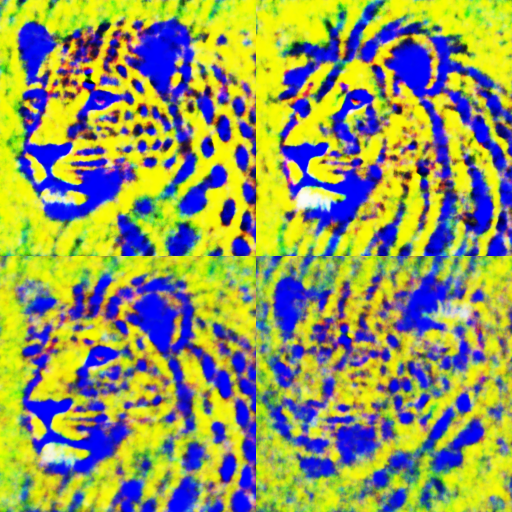

Status: : ETR=0:45:59.669342	ETA=0:57:29.586678	T=0:11:29.917336	Progress: 600/3000

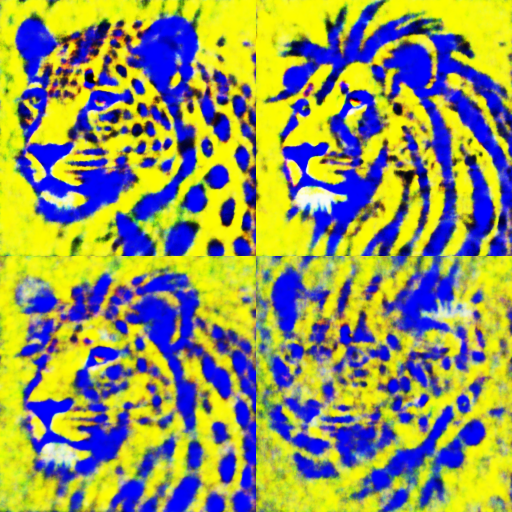

Status: : ETR=0:42:08.461420	ETA=0:57:27.901937	T=0:15:19.440516	Progress: 800/3000

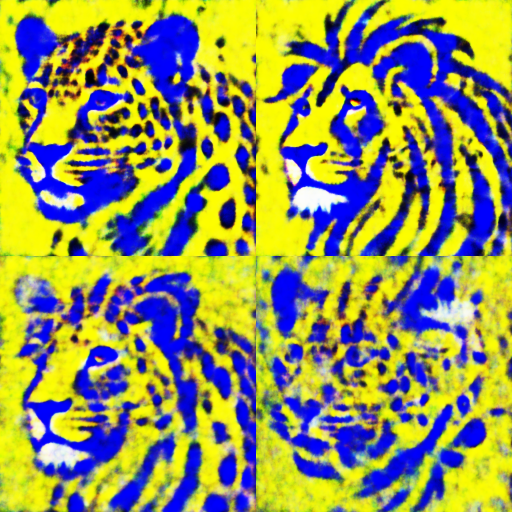

Status: : ETR=0:38:18.719366	ETA=0:57:28.079048	T=0:19:09.359683	Progress: 1000/3000

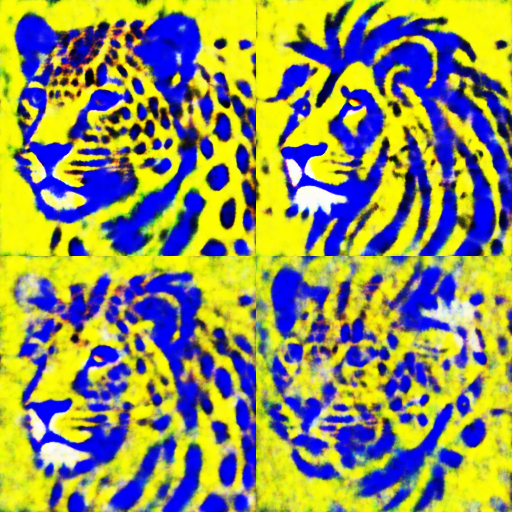

Status: : ETR=0:34:28.480167	ETA=0:57:27.466944	T=0:22:58.986778	Progress: 1200/3000

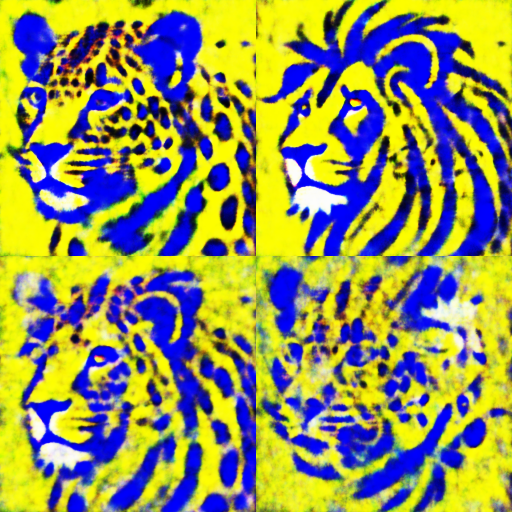

Status: : ETR=0:30:38.397284	ETA=0:57:26.994908	T=0:26:48.597624	Progress: 1400/3000

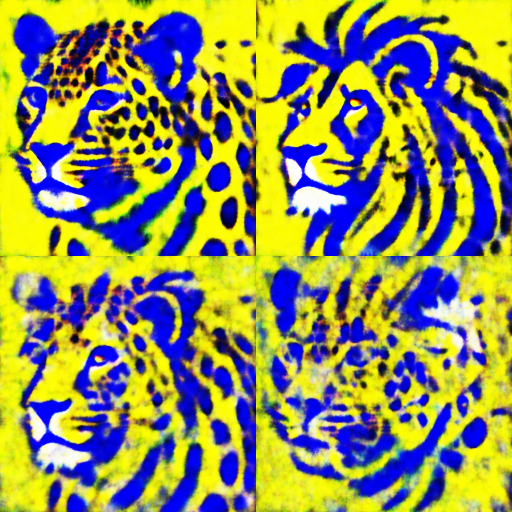

Status: : ETR=0:26:48.719673	ETA=0:57:27.256443	T=0:30:38.536770	Progress: 1600/3000

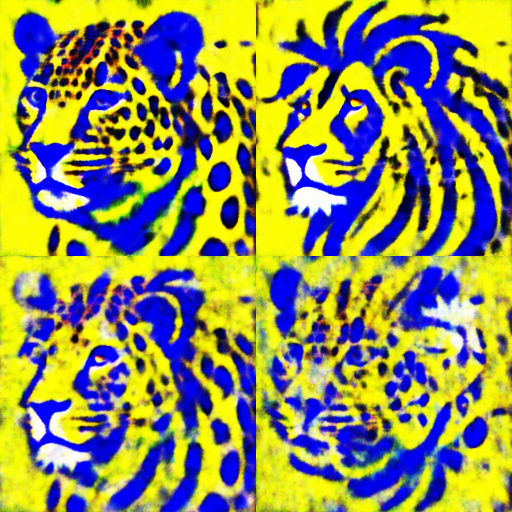

Status: : ETR=0:22:58.856953	ETA=0:57:27.142383	T=0:34:28.285430	Progress: 1800/3000

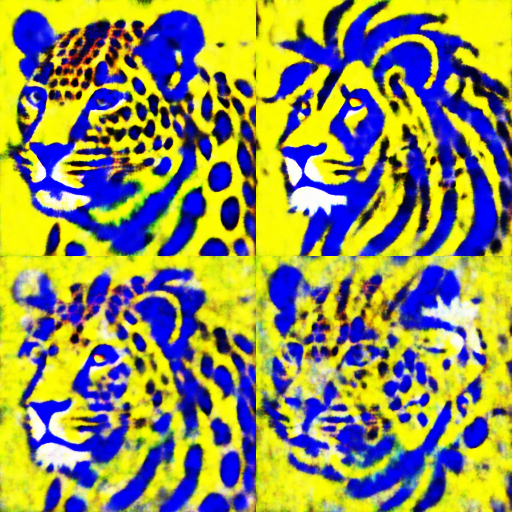

Status: : ETR=0:19:09.041444	ETA=0:57:27.124331	T=0:38:18.082887	Progress: 2000/3000

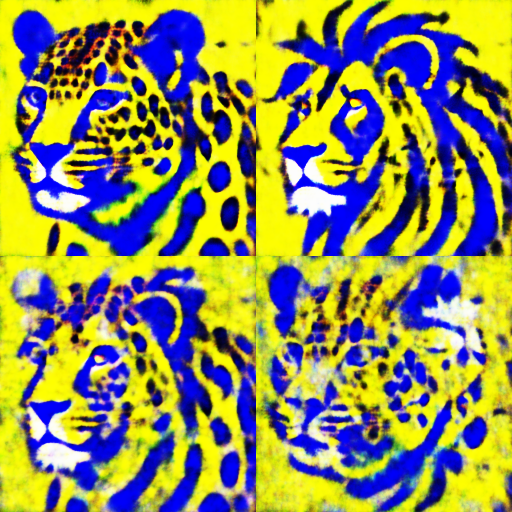

Status: : ETR=0:15:19.331587	ETA=0:57:27.493453	T=0:42:08.161865	Progress: 2200/3000

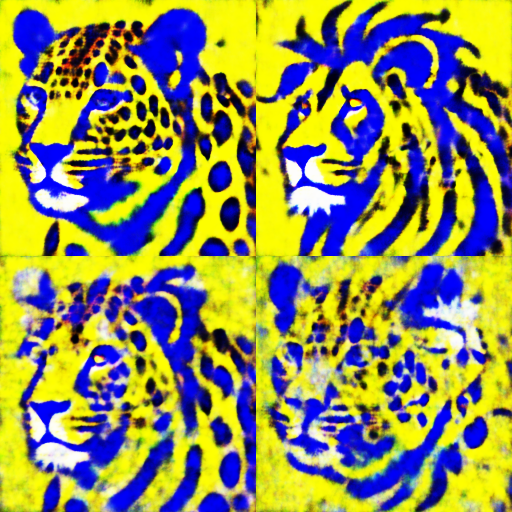

Status: : ETR=0:11:29.462877	ETA=0:57:27.314387	T=0:45:57.851510	Progress: 2400/3000

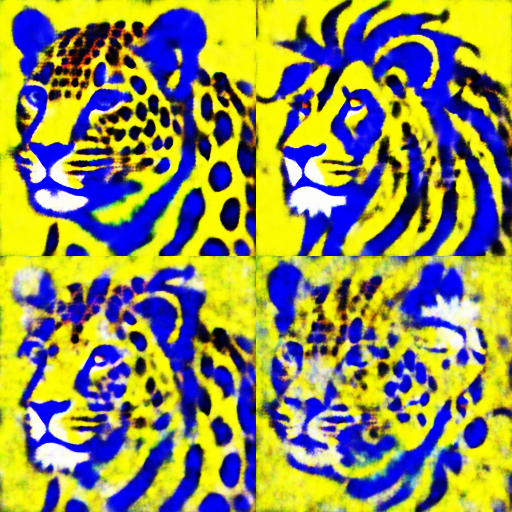

Status: : ETR=0:07:39.592174	ETA=0:57:26.941302	T=0:49:47.349128	Progress: 2600/3000

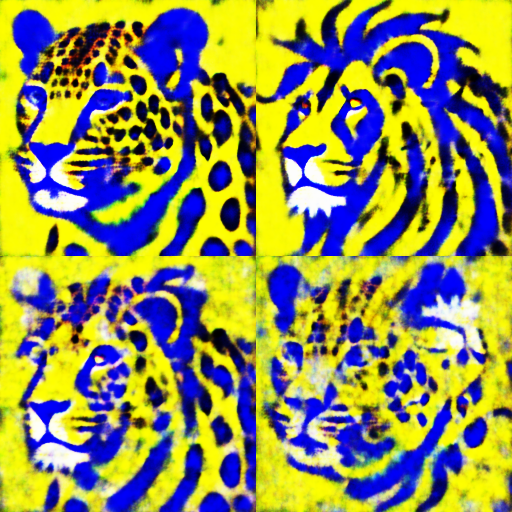

Status: : ETR=0:03:49.820213	ETA=0:57:27.303190	T=0:53:37.482978	Progress: 2800/3000

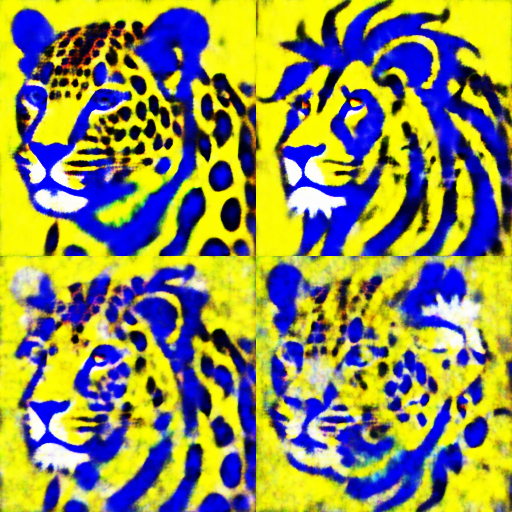

Status: : ETR=0:00:01.149116	ETA=0:57:27.346745	T=0:57:26.197629	Progress: 2999/3000

In [ ]:
NUM_ITER=3000

#Set the minimum and maximum noise timesteps for the dream loss (aka score distillation loss)
s.max_step=MAX_STEP=990
s.min_step=MIN_STEP=10

display_eta=rp.eta(NUM_ITER, title='Status: ')

DISPLAY_INTERVAL = 200

print('Every %i iterations we display an image in the form [[image_x, image_y], [bottom_image, top_image]] where'%DISPLAY_INTERVAL)
print('    image_x = bottom_image * top_image')
print('    image_y = bottom_image * top_image.rot180()')
print()
print('Interrupt the kernel at any time to return the currently displayed image')
print('You can run this cell again to resume training later on')
print()
print('Please expect this to take hours to get good images (especially on the slower Colab GPU\'s! The longer you wait the better they\'ll be')

img1, img2 = None, None

try:
    for iter_num in range(NUM_ITER):
        display_eta(iter_num) #Print the remaining time

        preds=[]
        for label,learnable_image,weight in rp.random_batch(list(zip(labels,learnable_images,weights)), batch_size=1):
            pred=s.train_step(
                label.embedding,
                learnable_image()[None],

                #PRESETS (uncomment one):
                noise_coef=.1*weight,guidance_scale=60,#10
                # noise_coef=0,image_coef=-.01,guidance_scale=50,
                # noise_coef=0,image_coef=-.005,guidance_scale=50,
                # noise_coef=.1,image_coef=-.010,guidance_scale=50,
                # noise_coef=.1,image_coef=-.005,guidance_scale=50,
                # noise_coef=.1*weight, image_coef=-.005*weight, guidance_scale=50,
            )
            preds+=list(pred)

        with torch.no_grad():
            if iter_num and not iter_num%(DISPLAY_INTERVAL*50):
                #Wipe the slate every 50 displays so they don't get cut off
                from IPython.display import clear_output
                clear_output()

            if not iter_num%DISPLAY_INTERVAL:
                im = get_display_image()
                ims.append(im)
                rp.display_image(im)
        optim.step()
        optim.zero_grad()
except KeyboardInterrupt:
    print()
    print('Interrupted early at iteration %i'%iter_num)
    im = get_display_image()
    ims.append(im)
    rp.display_image(im)

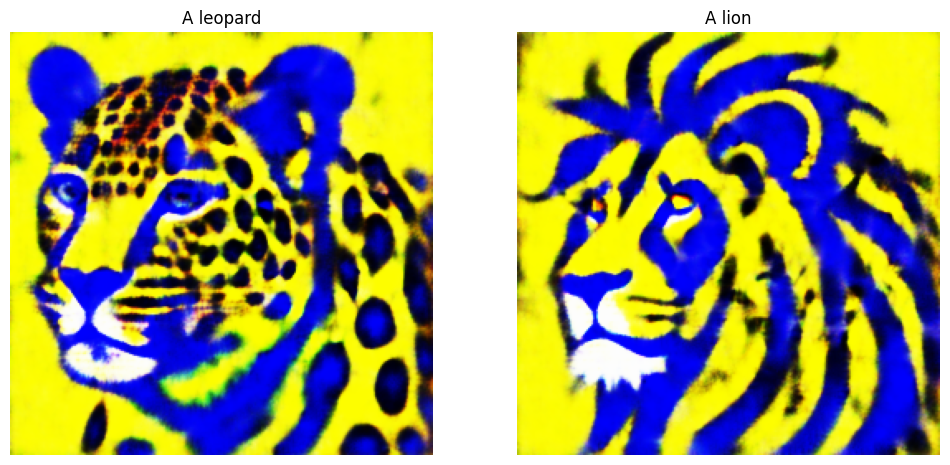

In [ ]:
import matplotlib.pyplot as plt

img_x_tensor = learnable_image_x()
img_y_tensor = learnable_image_y()
img_x_np = img_x_tensor.permute(1, 2, 0).detach().cpu().numpy()
img_y_np = img_y_tensor.permute(1, 2, 0).detach().cpu().numpy()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(img_x_np)
plt.axis('off')
plt.title(prompt_x)

plt.subplot(1, 2, 2)
plt.imshow(img_y_np)
plt.axis('off')
plt.title(prompt_y)

plt.show()

## Generating Hybrid Image

In [ ]:
# Separate the high-frequency and low-frequency components of the image
def separate_frequencies(img, mask_type='low', cutoff=0.1):

    C, H, W = img.shape
    fft = torch.fft.fft2(img, dim=(-2, -1))
    fft_shift = torch.fft.fftshift(fft, dim=(-2, -1))

    y, x = torch.meshgrid(torch.linspace(-0.5, 0.5, H, device=img.device),
                          torch.linspace(-0.5, 0.5, W, device=img.device))
    radius = torch.sqrt(x**2 + y**2)
    if mask_type == 'low':
        mask = (radius <= cutoff).float()
    elif mask_type == 'high':
        mask = (radius > cutoff).float()
    else:
        raise ValueError("mask_type must be 'low' or 'high'")

    mask = mask.unsqueeze(0)
    mask = mask.repeat(C, 1, 1)

    separated_fft = fft_shift * mask

    separated_fft_shift = torch.fft.ifftshift(separated_fft, dim=(-2, -1))
    separated_img = torch.fft.ifft2(separated_fft_shift, dim=(-2, -1))
    separated_img = separated_img.real

    return separated_img

/usr/local/lib/python3.10/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


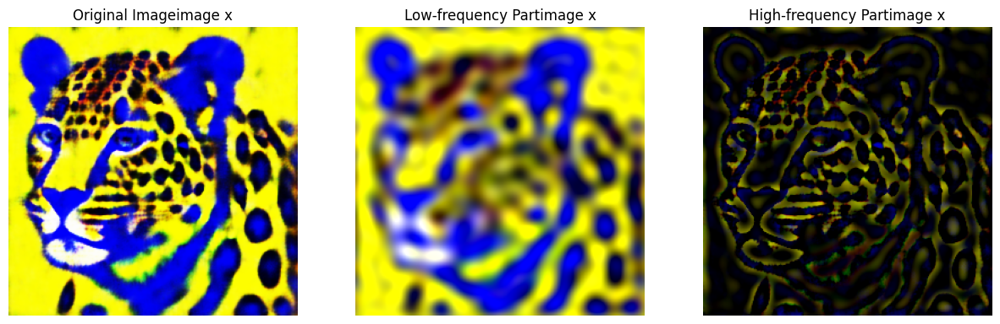

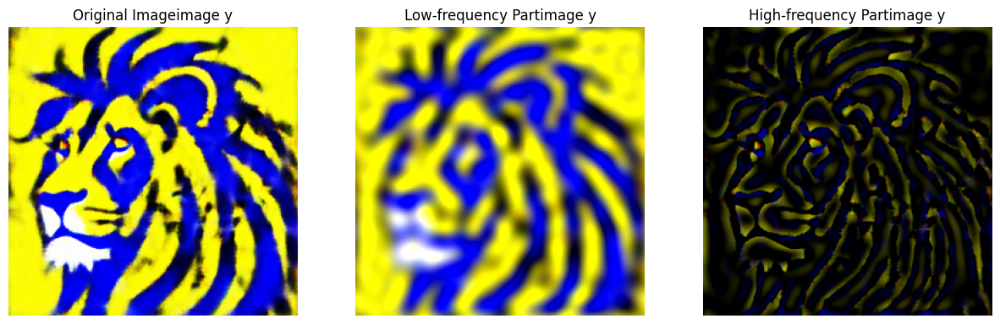

In [ ]:
cutoff_freq = 0.05 # This is the cutoff frequency: low frequencies are less than cutoff_freq, and high frequencies are greater than cutoff_freq

# Separate different frequency components in both images
img_x_low = separate_frequencies(img_x_tensor, mask_type='low', cutoff=cutoff_freq)
img_x_high = separate_frequencies(img_x_tensor, mask_type='high', cutoff=cutoff_freq)
img_y_low = separate_frequencies(img_y_tensor, mask_type='low', cutoff=cutoff_freq)
img_y_high = separate_frequencies(img_y_tensor, mask_type='high', cutoff=cutoff_freq)

def show_images(original, low_freq, high_freq, title_suffix=''):
    original = original.squeeze().permute(1, 2, 0).detach().cpu().numpy()
    low_freq = low_freq.squeeze().permute(1, 2, 0).detach().cpu().numpy()
    high_freq = high_freq.squeeze().permute(1, 2, 0).detach().cpu().numpy()

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(original)
    axs[0].set_title('Original Image' + title_suffix)
    axs[0].axis('off')

    axs[1].imshow(low_freq)
    axs[1].set_title('Low-frequency Part' + title_suffix)
    axs[1].axis('off')

    axs[2].imshow(high_freq)
    axs[2].set_title('High-frequency Part' + title_suffix)
    axs[2].axis('off')

    plt.show()

# Display different frequency components in both images
show_images(img_x_tensor, img_x_low, img_x_high, title_suffix='image x')
show_images(img_y_tensor, img_y_low, img_y_high, title_suffix='image y')

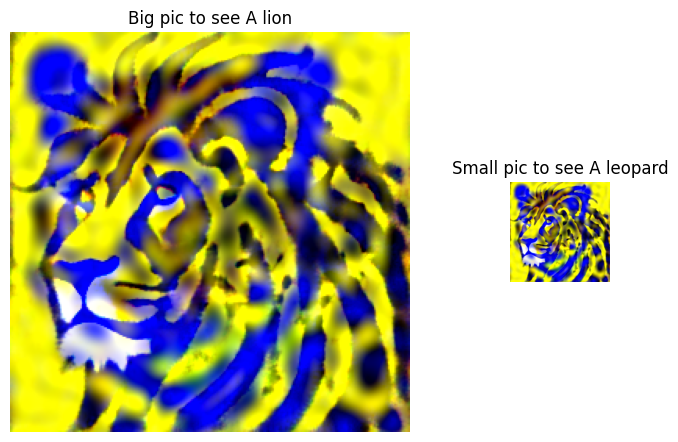

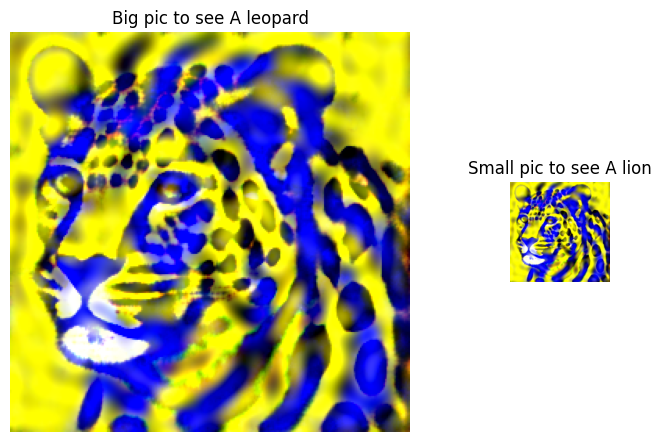

In [ ]:
def merge_frequencies(low_freq, high_freq):
    merged_fft = torch.fft.fft2(low_freq, dim=(-2, -1)) + torch.fft.fft2(high_freq, dim=(-2, -1))
    merged_fft_shift = torch.fft.fftshift(merged_fft, dim=(-2, -1))
    merged_img = torch.fft.ifft2(torch.fft.ifftshift(merged_fft_shift, dim=(-2, -1)), dim=(-2, -1))
    merged_img = merged_img.real
    return merged_img

# Combine the high-frequency and low-frequency components of different images to create an optical illusion
merged_img_1 = merge_frequencies(img_x_low, img_y_high)
merged_img_2 = merge_frequencies(img_y_low, img_x_high)

# Display the merged image
def show_merged_image(merged, blur_prompt, delicate_prompt):
    merged = merged.squeeze().permute(1, 2, 0).detach().cpu().numpy()

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=100)

    axes[0].set_position([0.05, 0.1, 0.4, 0.8])
    axes[1].set_position([0.55, 0.4, 0.1, 0.2])
    axes[0].set_title(f'Big pic to see {delicate_prompt}')
    axes[1].set_title(f'Small pic to see {blur_prompt}')

    axes[0].imshow(merged)
    axes[1].imshow(merged)
    axes[0].axis('off')
    axes[1].axis('off')
    plt.show()


show_merged_image(merged_img_1, prompt_x, prompt_y)
show_merged_image(merged_img_2, prompt_y, prompt_x)